In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from functions import *

plt.style.use(plt.style.available[5])

# 3.1. Box Filter

3.1.3. What is the resulting filter if apply the 3 × 3 box filter many times? (Test on grayscale Elaine Image).


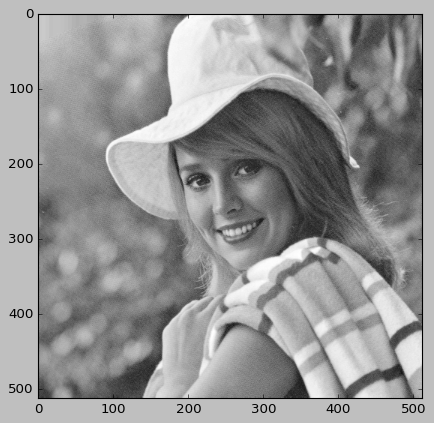

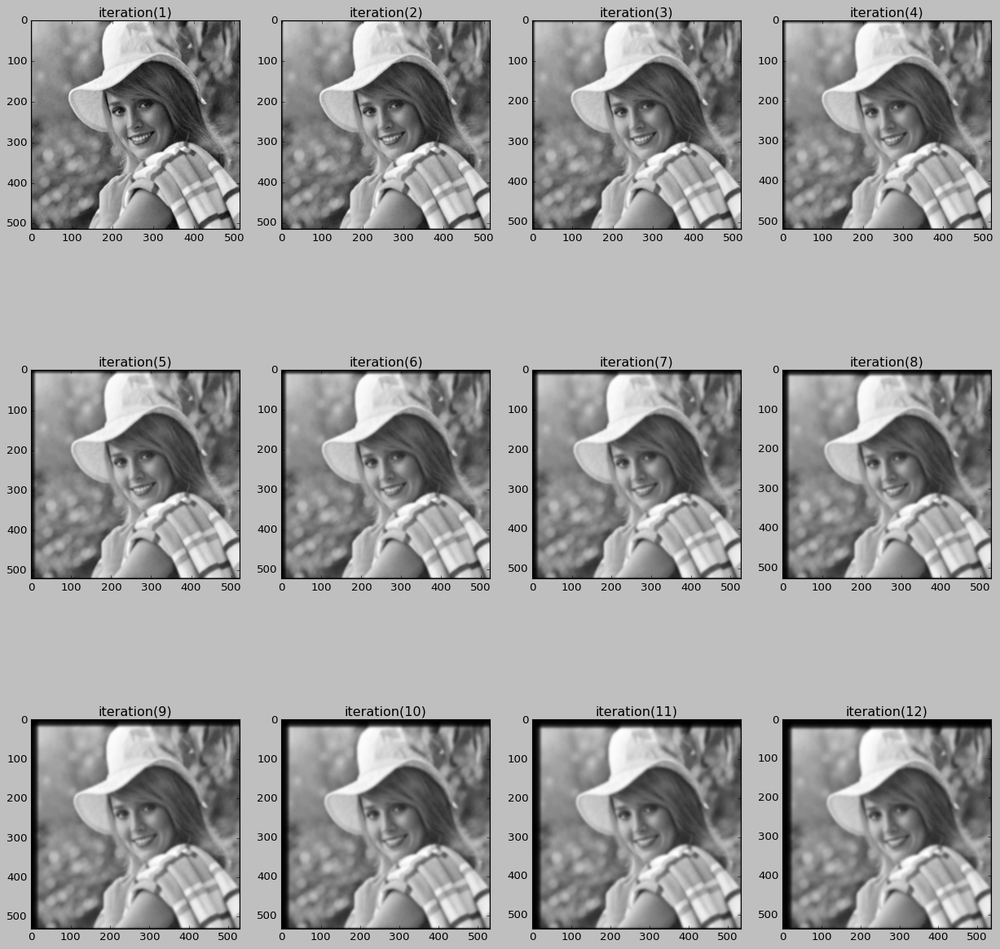

In [2]:
elaine1 = cv2.imread('Elaine.bmp',cv2.IMREAD_GRAYSCALE)
plt.imshow(elaine1,cmap='gray')

figure = plt.figure(figsize=(19,19))

for i in range(12):
    elaine_padded = clip_filter(elaine1,1)
    elaine1 = box_filter(elaine_padded,3)

    figure.add_subplot(3,4,i+1)
    plt.imshow(elaine1,cmap='gray')
    plt.title(f"iteration({i+1})",color='black')
 

3.1.4. How does the size of the mask affect blurring and noise reduction? (Test on grayscale Elaine Image).

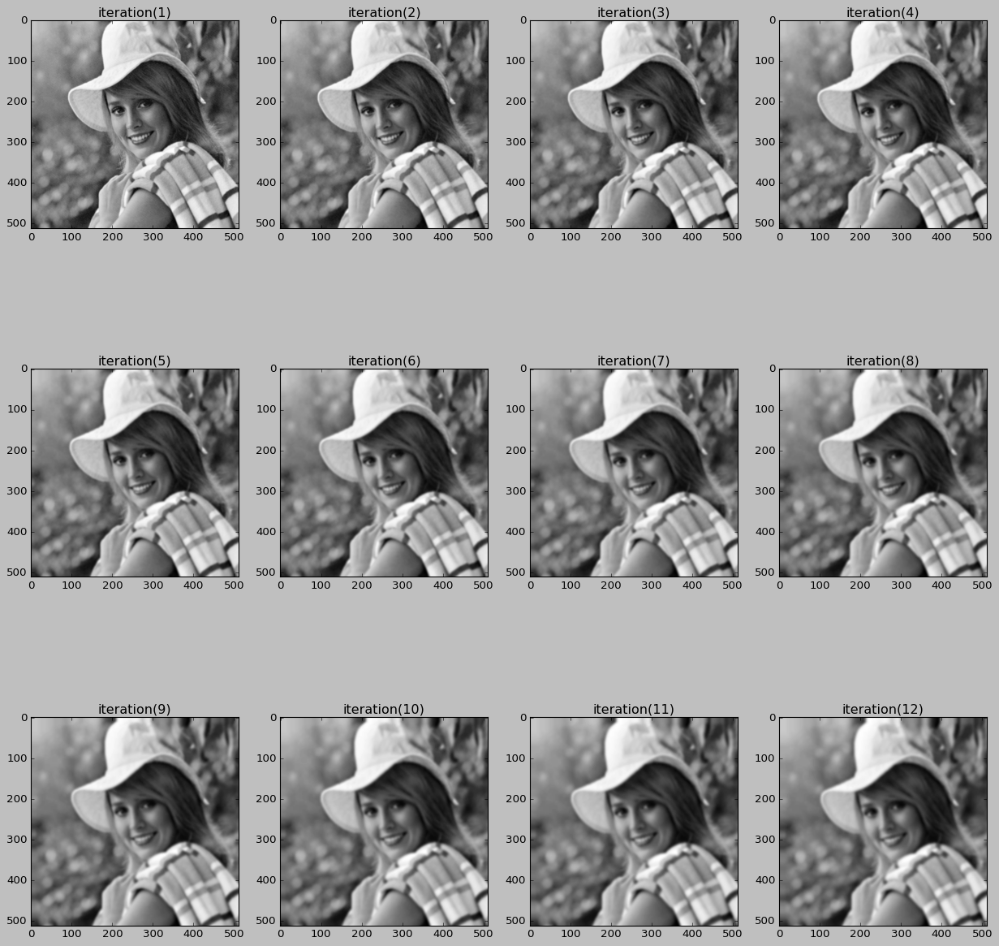

In [3]:
elaine = cv2.imread('Elaine.bmp',cv2.IMREAD_GRAYSCALE)

figure = plt.figure(figsize=(19,19))

for i in range(12):
    # elaine_padded = clip_filter(elaine,3)
    elaine = box_filter(elaine)
    figure.add_subplot(3,4,i+1)
    plt.imshow(elaine,cmap='gray')
    plt.title(f"iteration({i+1})",color='black')
 

3.1.5. Which mask size do you think provides a better tradeoff between blurring and noise reduction for this image?

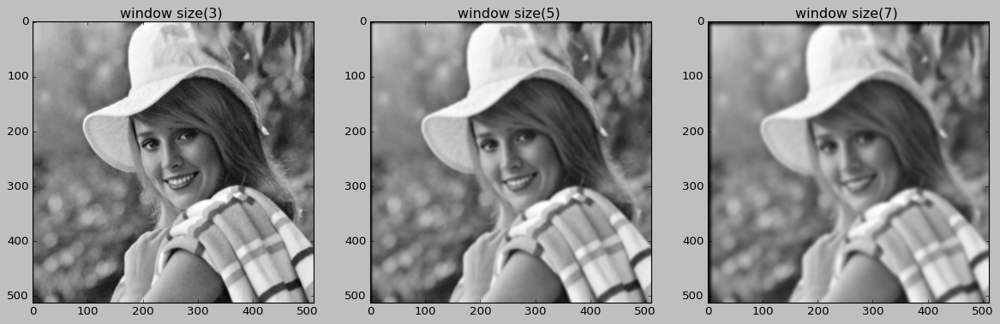

In [4]:
elaine = cv2.imread('Elaine.bmp',cv2.IMREAD_GRAYSCALE)

figure = plt.figure(figsize=(18,18))
n = 1 # padding size
m = 3 # window size
for i in range(3):

    elaine_padded = clip_filter(elaine,n)
    elaine = box_filter(elaine_padded,m,n)

    figure.add_subplot(3,3,i+1)
    plt.imshow(elaine,cmap='gray')
    plt.title(f"window size({m}) ",color='black')

    n +=1
    m +=2

plt.show()

3.1.6. What is the resulting if apply Laplacian mask ([0 -1 0; -1 5 -1;0 -1 0]) many times? (Test output of 3.1.3).


2 2
2 2
2 2


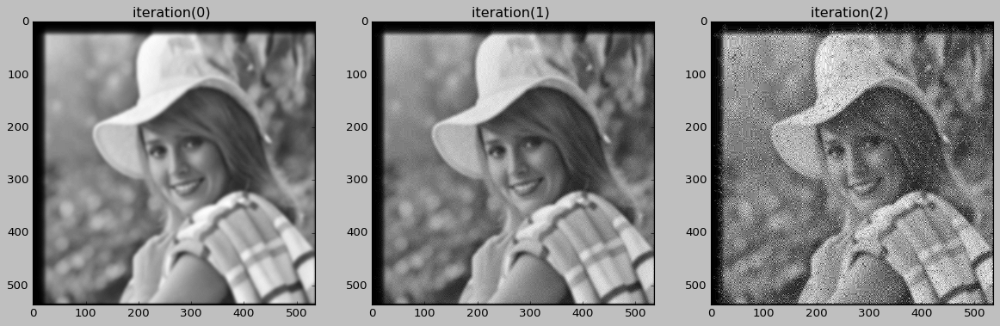

In [5]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from functions import *

plt.style.use(plt.style.available[5])
elaine = cv2.imread('Elaine.bmp',cv2.IMREAD_GRAYSCALE)
# elaine_padded = clip_filter(elaine1,2)

mask = np.array([0,-1,0,-1,5,-1,0,-1,0])
mask = mask.reshape(3,3)
figure = plt.figure(figsize=(18,18))

for i in range(3):
    elaine1 = laplacian_filter(elaine1,mask)

    figure.add_subplot(1,3,i+1)
    plt.imshow(elaine1,cmap='gray')
    plt.title(f"iteration({i}) ",color='black')


# 3.2. Median Filter


3.2.1. Write a program that can, first, add salt-and-pepper noise to an image with a specified noise density. Try different 
noise density (0.05, 0.1, 0.2, 0.4). Then, perform median filtering with a specified window size. Consider only the 
median filter with a square shape. For each density, discuss the effect of filtering with different window sizes 
(3, 5, 7, 9) and experimentally determine the best window size. Note: you can use imnoise and immse functions
to generate noisy images and compare the quality of images, respectively. Also, you can ignore the boundary 
problem by only performing the filtering for the pixels inside the boundary. (Test on grayscale Elaine Image).

In [6]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from functions import *

plt.style.use(plt.style.available[5])

Text(0.5, 1.0, '0.4')

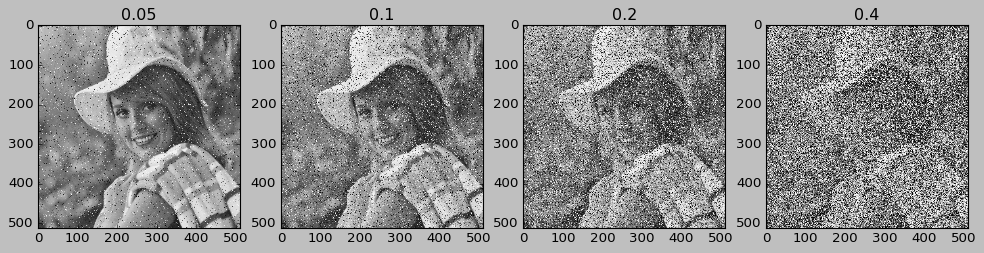

In [7]:
eliane = cv2.imread('Elaine.bmp',cv2.IMREAD_GRAYSCALE)


figure = plt.figure(figsize=(15,15))

elaine_noisey = salt_pepper(eliane,0.05)
figure.add_subplot(1,4,1)
plt.imshow(elaine_noisey,cmap='gray')
plt.title('0.05')

elaine_noisey = salt_pepper(eliane,0.1)
figure.add_subplot(1,4,2)
plt.imshow(elaine_noisey,cmap='gray')
plt.title('0.1')

elaine_noisey = salt_pepper(eliane,0.2)
figure.add_subplot(1,4,3)
plt.imshow(elaine_noisey,cmap='gray')
plt.title('0.2')

elaine_noisey = salt_pepper(eliane,0.4)
figure.add_subplot(1,4,4)
plt.imshow(elaine_noisey,cmap='gray')
plt.title('0.4')

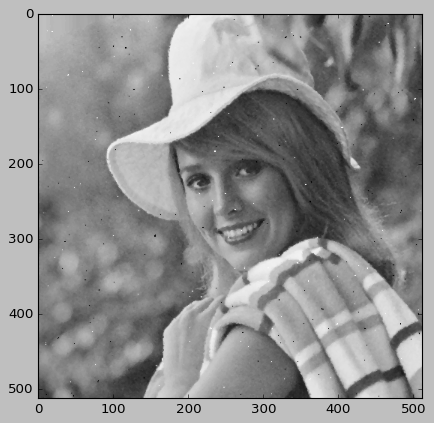

In [8]:
eliane = cv2.imread('Elaine.bmp',cv2.IMREAD_GRAYSCALE)
elaine_noisey = salt_pepper(eliane,0.2)
elaine_median = median_filter(eliane,windowSize=3)
plt.imshow(elaine_median,cmap='gray')

mean_square_error((0, 0.05)) = 1035.015167
mean_square_error((0, 0.05)) = 2001.436935
mean_square_error((0, 0.05)) = 2966.698025
mean_square_error((0, 0.05)) = 3893.466320
mean_square_error((1, 0.1)) = 5195.475830
mean_square_error((1, 0.1)) = 6718.848930
mean_square_error((1, 0.1)) = 8151.863060
mean_square_error((1, 0.1)) = 9456.456993
mean_square_error((2, 0.2)) = 11535.492210
mean_square_error((2, 0.2)) = 13328.117294
mean_square_error((2, 0.2)) = 14737.991238
mean_square_error((2, 0.2)) = 15809.598293
mean_square_error((3, 0.4)) = 17208.071606
mean_square_error((3, 0.4)) = 17887.859982
mean_square_error((3, 0.4)) = 18120.766586
mean_square_error((3, 0.4)) = 18233.742203


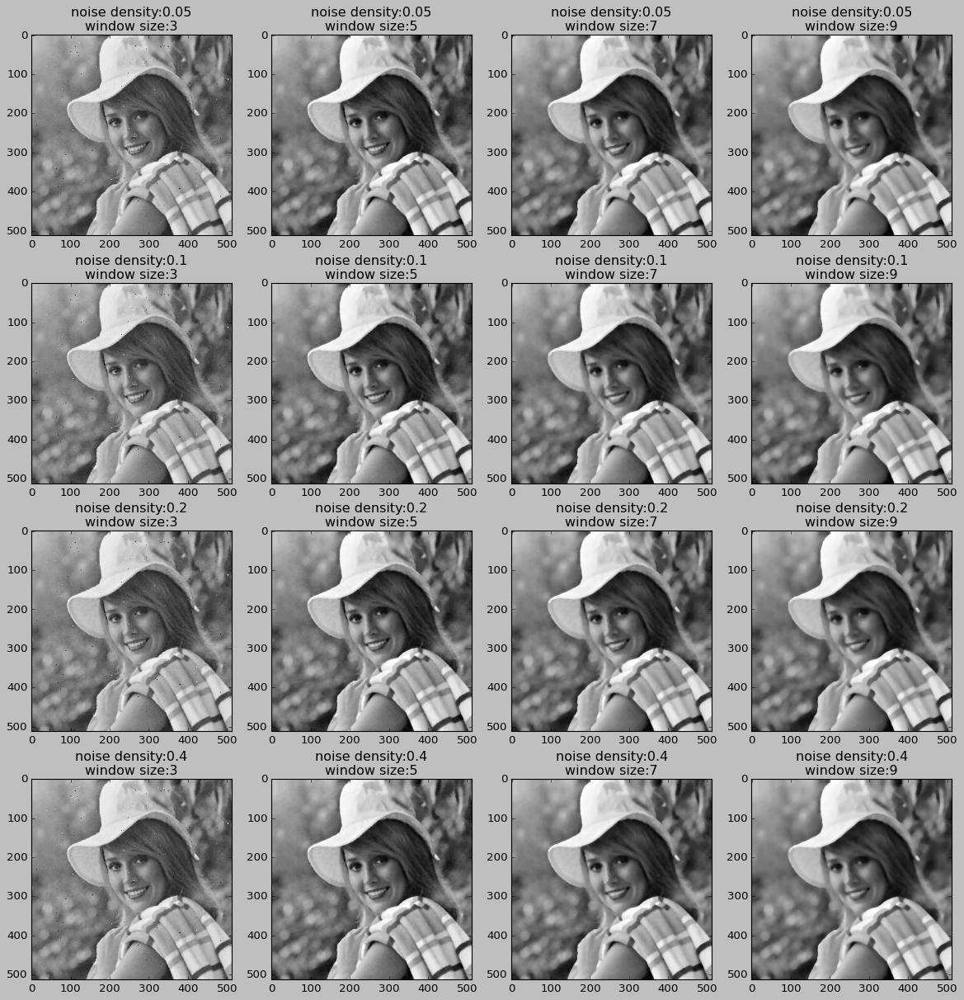

In [9]:
elaine = cv2.imread('Elaine.bmp',cv2.IMREAD_GRAYSCALE)
figure =  plt.figure(figsize=(18,18))
noise_density = [0.05 , 0.1, 0.2, 0.4]
windowSizes = [3,5,7,9]
for i,nd in enumerate(noise_density):
    for j,ws in enumerate(windowSizes):
        elaine_noisey = salt_pepper(elaine,nd)
        elaine_median = median_filter(eliane,windowSize=ws)
        # calculate MSE, for original image cases
        mse = mean_square_error(elaine,elaine_median)
        print(f'mean_square_error({i,nd}) = {mse}')
        figure.add_subplot(4,4,(4*i)+(j+1))
        plt.imshow(elaine_median,cmap='gray')
        plt.title(f'noise density:{nd}\nwindow size:{ws}')



3.2.2. Create a program for adding Gaussian noise with different variance and filtering using average and median filter, 
respectively. Apply the averaging filter and the median filter to an image with Gaussian noise (with a chosen 
noise variance). Discuss the effectiveness of each filter on this type of noise. Note: You can use imnoise and 
immse functions to generate noisy images and compare the quality of images, respectively. (Test on grayscale 
Elaine Image).


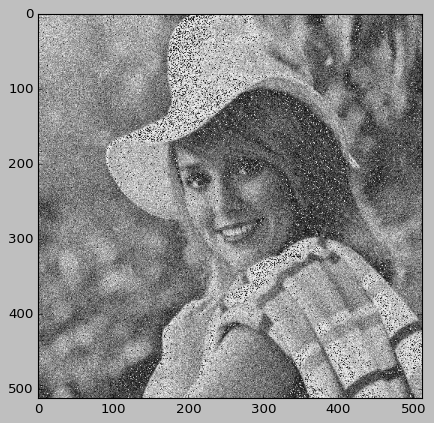

In [10]:
import numpy as np
import cv2
from matplotlib import pyplot as plt
elaine = cv2.imread("Elaine.bmp",cv2.IMREAD_GRAYSCALE)
mean = 0
var = 80
sigma = var ** 0.8
gaussian = np.random.normal(mean, sigma, size=elaine.shape) 
noisy_image = np.zeros_like(elaine)
noisy_image = np.add(elaine,gaussian.astype('uint8'))
plt.imshow(noisy_image, cmap='gray')



343.701706
301.228260
392.741177
507.773682


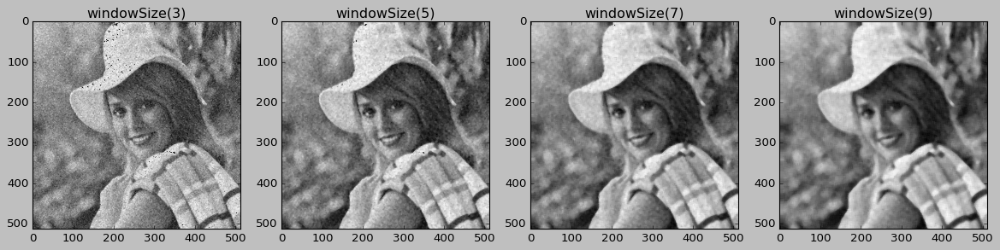

In [11]:
figure = plt.figure(figsize=(18,18))
window = [3,5,7,9]

for i in range(4):
    elaine_gaussin_medain = median_filter(noisy_image,window[i])
    print(mean_square_error(elaine,elaine_gaussin_medain))
    figure.add_subplot(1,4,i+1)
    plt.imshow(elaine_gaussin_medain,cmap='gray')
    plt.title(f"windowSize({window[i]})",color='black')

447.532970
429.183887
504.692562
598.647766


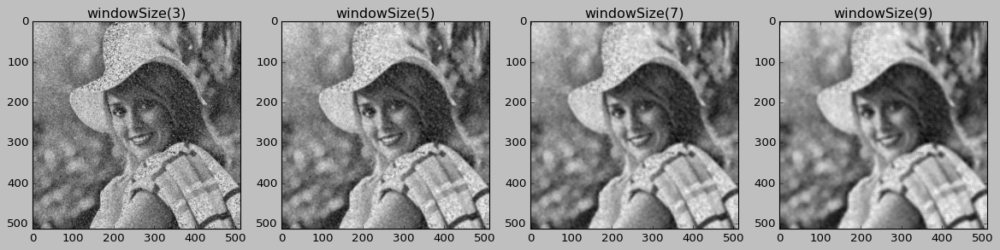

In [12]:
figure = plt.figure(figsize=(18,18))
window = [3,5,7,9]
for i in range(4):
    elaine_gaussin_box = box_filter(noisy_image,window[i])
    print(mean_square_error(elaine,elaine_gaussin_box))
    figure.add_subplot(1,4,i+1)
    plt.imshow(elaine_gaussin_box,cmap='gray')
    plt.title(f"windowSize({window[i]})",color='black')


3.2.3. Design proper filters to simultaneously remove Gaussian and salt & pepper noise. Please detail the 
steps of the denoising process and specify corresponding parameters. Provide some discussions 
about the reason why those filters and parameters are chosen.


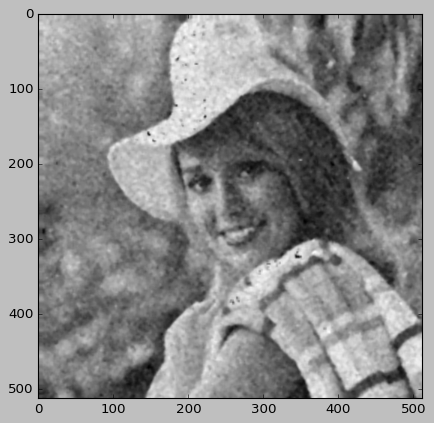

In [13]:
elaine = cv2.imread("Elaine.bmp" , cv2.IMREAD_GRAYSCALE)
mean = 0
var = 70
sigma = var ** 0.8
gaussian = np.random.normal(mean, sigma, size=elaine.shape) 
noisy_image = np.zeros_like(elaine)
noisy_image = np.add(elaine,gaussian.astype('uint8'))

noisy_image2 = salt_pepper(noisy_image,0.3)
elaine1 = median_filter(noisy_image2,windowSize=5)
elaine2 = box_filter(elaine1,windowSize=3)

plt.imshow(elaine2,cmap='gray')

# 3.3. Sharpening, Blurring, and Noise Removal

3.3.1. Take blurry and noisy images (shooting in low light is a good way to get both) by your cellphone and try to improve 
their appearance and legibility. Display and discuss the results before and after improving.


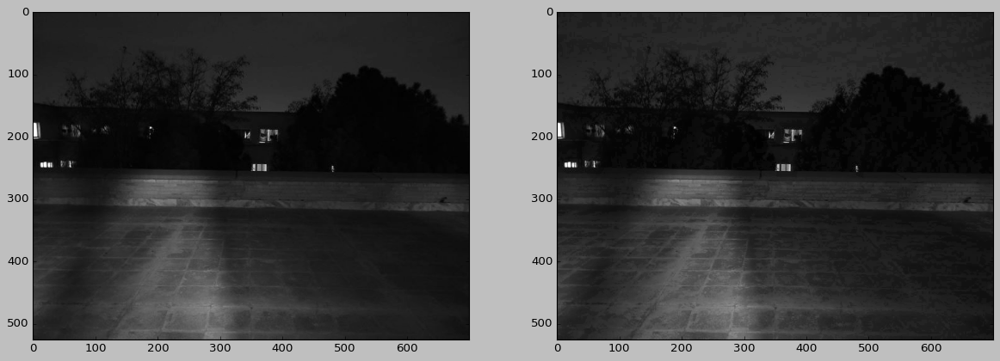

In [14]:
sample = cv2.imread('sample3.jpg',cv2.IMREAD_GRAYSCALE)

figure = plt.figure(figsize=(18,18))
figure.add_subplot(1,2,1)
plt.imshow(sample,cmap='gray')

sample_gaussin = box_filter(sample,windowSize=11)
image2 = sample_gaussin - sample
a = 0.020
image3 = np.multiply(image2,a)
image4 = sample + image3
figure.add_subplot(1,2,2)
plt.imshow(image4,cmap='gray')

# 3.4. Edge Detection 

3.4.1. These are often used first-order difference filters in x-direction:
𝑎)
1/2
[1 0 −1],
𝑏)
1/6
[ 1 0 −1
1 0 −1
1 0 −1], 
𝑐)
1/8
[ 1 0 −1
2 0 −2
1 0 −1
]
Compare and describe the properties of the three filters; In the following discuss the efficiency of filters for edge 
detection problems. Are these filters suitable for computing the 2-D gradient? (Test on Elaine Lena Image)

0 2
2 2
2 2


Text(0.5, 1.0, 'elaine_c')

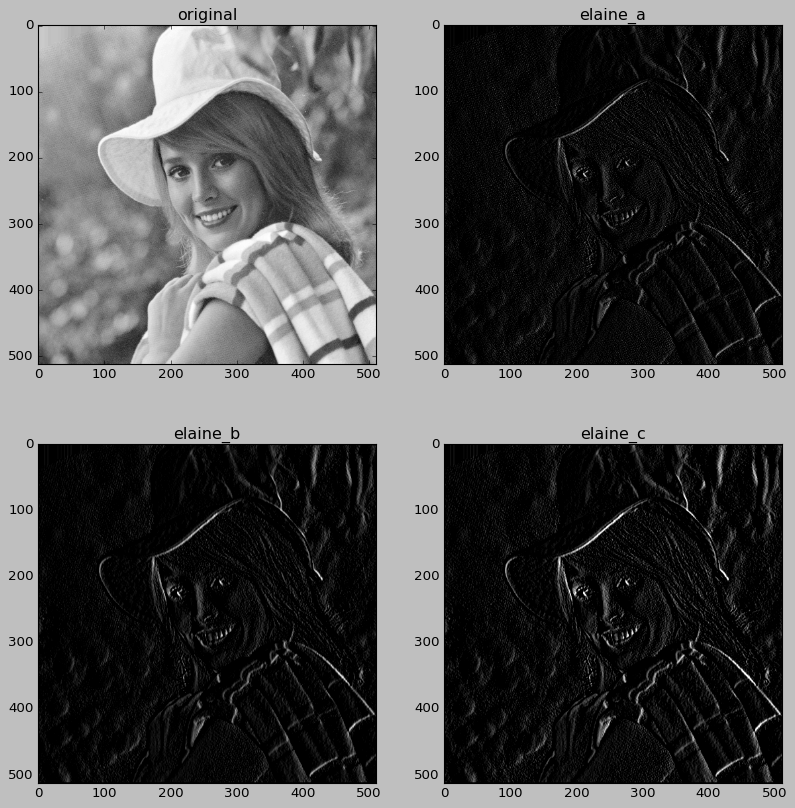

In [15]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from functions import *

plt.style.use(plt.style.available[5])


elaine = cv2.imread('Elaine.bmp',cv2.IMREAD_GRAYSCALE)

mask1 = np.array([1,0,-1])
mask1 = mask1.reshape(1,3)
mask2 = np.array([1,0,-1,1,0,-1,1,0,-1])
mask2 = mask2.reshape(3,3)
mask3 = np.array([1,0,-1,2,0,-2,1,0,-1])
mask3 = mask3.reshape(3,3)

filter_a  = weighted_filter(elaine,mask1,(0.5))
filter_b  = weighted_filter(elaine,mask2,(1/6))
filter_c  = weighted_filter(elaine,mask3,(1/8))

figure = plt.figure(figsize=(12,12))

figure.add_subplot(2,2,1)
plt.imshow(elaine,cmap='gray')
plt.title('original')

figure.add_subplot(2,2,2)
plt.imshow(filter_a,cmap='gray')
plt.title('elaine_a')

figure.add_subplot(2,2,3)
plt.imshow(filter_b,cmap='gray')
plt.title('elaine_b')

figure.add_subplot(2,2,4)
plt.imshow(filter_c,cmap='gray')
plt.title('elaine_c')


3.4.2. Robert suggested the filter to compute the 2-D gradient and to detect edges.
𝑎) [
1 0
0 −1
], 𝑏) [
0 1
−1 0
]
First, in which directions do these filters detect edges? Second, compare the quality of this filter with the filter 
from previous steps. (Test on grayscale Elaine Image).

1 1
1 1


Text(0.5, 1.0, 'robert_b')

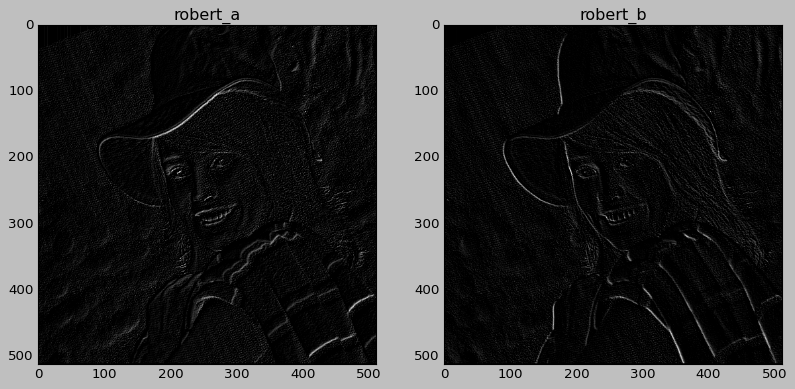

In [16]:
elaine = cv2.imread('Elaine.bmp',cv2.IMREAD_GRAYSCALE)
mask1 = np.array([1,0,0,-1])
mask1 = mask1.reshape(2,2)
mask2 = np.array([0,1,-1,0])
mask2 = mask2.reshape(2,2)

robert_a = weighted_filter(elaine,mask1)
robert_b = weighted_filter(elaine,mask2)

figure = plt.figure(figsize=(12,12))

figure.add_subplot(1,2,1)
plt.imshow(robert_a,cmap='gray')
plt.title('robert_a')

figure.add_subplot(1,2,2)
plt.imshow(robert_b,cmap='gray')
plt.title('robert_b')


# 3.5. Unsharp Masking

3.5.1. A simple unsharp masking filter has the following form:
(1 − 𝛼)𝐼 + 𝛼𝐼′ = 𝐼 + 𝛼(𝐼′ − 𝐼),
where 𝛼 ∈ [0, 1] represents the threshold step of strength sharpening and 𝐼′is smoothed version of 𝐼 which 
obtained using different filter sizes based on the gaussian filter. Compare and discuss the results for different 
filter sizes (3, 5, 7, 9, 11) and 𝛼 for the grayscale Lena image. What happens if we set 𝛼 very large or small? How to 
obtain the optimum value? Note: You can use imgaussfilt function for smoothing.

In [17]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from functions import *
plt.style.use(plt.style.available[5])

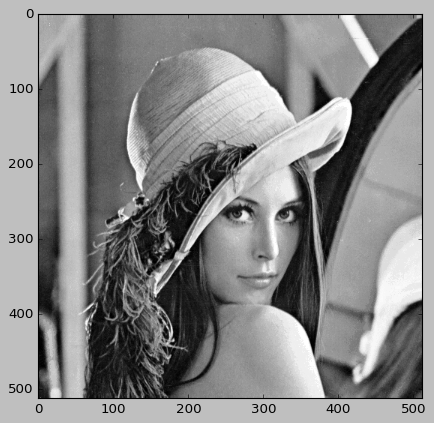

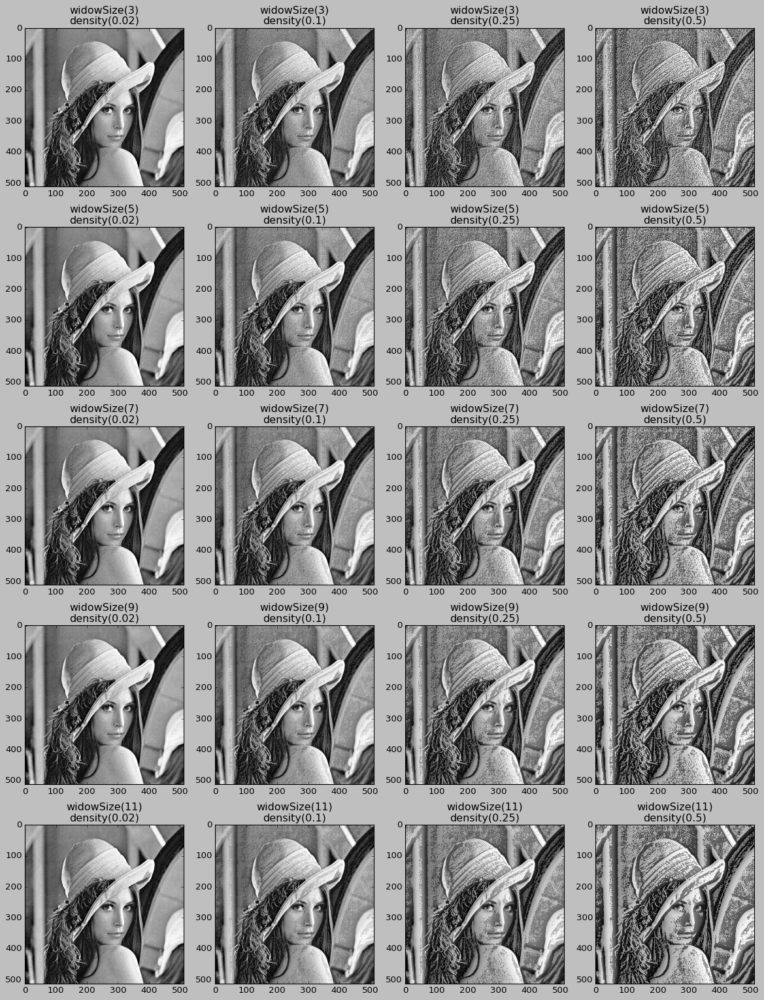

In [18]:
lena = cv2.imread('Lena.bmp',cv2.IMREAD_GRAYSCALE)
plt.imshow(lena,cmap='gray')
figure = plt.figure(figsize=(18,23))
windowSizes = [3,5,7,9,11]
density = [0.02,0.1,0.25,0.5]
for i , ws in enumerate(windowSizes):
    for j , nd in enumerate(density):
        lena = cv2.imread('Lena.bmp',cv2.IMREAD_GRAYSCALE)
        lena_gaussin = box_filter(lena,windowSize=windowSizes[i])
        image2 = lena_gaussin - lena
        a = density[j]
        image3 = np.multiply(image2,a)
        image4 = lena + image3
        figure.add_subplot(5,4,(4*i)+(j+1))
        plt.imshow(image4,cmap='gray')
        plt.title(f'widowSize({windowSizes[i]})\ndensity({density[j]})')